Add some explaining text ....

In [1]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

init_notebook_mode(connected=False)
cf.go_offline()

In [2]:
import os
import pandas as pd
import text2topics.model as model

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
data_dir = "/Users/jeriwieringa/Dissertation/data/"
output_dir = "/Users/jeriwieringa/Dissertation/site/files/interact/"

In [5]:
data = os.path.join(data_dir, "model_outputs", "target_300_10.18497.state.gz")

In [6]:
mallet_model = model.MalletModel(data)

In [7]:
df = mallet_model.model()
params = mallet_model.extract_params()

In [8]:
doc_topic = df.groupby(['#doc', 'topic'])['type'].count().reset_index(name="token_count")

In [9]:
#sanity check
model.pivot_smooth_norm(doc_topic, params[0], '#doc', 'topic', 'token_count')[:10]

topic,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
#doc,,,,,,,,,,,,,,,,,,,,,
0,0.000247,0.000077,0.000303,0.000252,0.000168,0.000858,0.000106,0.000355,0.000158,0.000083,...,0.000093,0.000146,0.000120,0.000251,0.000099,0.008392,0.000134,0.000146,0.000133,0.000091
1,0.000279,0.000087,0.000343,0.000285,0.037680,0.010343,0.000120,0.000402,0.000178,0.000094,...,0.000106,0.000165,0.000135,0.000284,0.000112,0.000121,0.000151,0.000165,0.000150,0.000103
2,0.000265,0.000082,0.000325,0.000269,0.000180,0.009792,0.000113,0.000381,0.159891,0.000089,...,0.000100,0.000157,0.000128,0.000269,0.000106,0.000115,0.000143,0.000157,0.000142,0.000098
3,0.000293,0.000091,0.000360,0.000299,0.000200,0.001018,0.000125,0.000422,0.000187,0.000098,...,0.000111,0.000173,0.000142,0.000298,0.000118,0.000127,0.000159,0.000174,0.000158,0.000109
4,0.000237,0.000074,0.055981,0.000242,0.000162,0.000824,0.000101,0.000341,0.000151,0.000080,...,0.000090,0.000140,0.000115,0.008196,0.000095,0.000103,0.000128,0.000140,0.000128,0.000088
5,0.000253,0.000079,0.000311,0.000258,0.000173,0.000880,0.000108,0.000365,0.025651,0.000085,...,0.000096,0.000150,0.000123,0.000257,0.000102,0.000110,0.000137,0.000150,0.000136,0.000094
6,0.000233,0.015735,0.000287,0.000238,0.000159,0.000811,0.000100,0.000336,0.000149,0.000078,...,0.000088,0.000138,0.000113,0.000237,0.000094,0.000101,0.000126,0.000138,0.000126,0.000086
7,0.000210,0.000065,0.000258,0.000214,0.000143,0.000731,0.000090,0.007360,0.000134,0.000071,...,0.000079,0.000125,0.000102,0.000214,0.077715,0.000091,0.000114,0.000125,0.000113,0.000078
8,0.000237,0.000074,0.000291,0.000242,0.000162,0.000824,0.000101,0.000341,0.000151,0.000080,...,0.000090,0.000140,0.000115,0.000241,0.000095,0.000103,0.000128,0.000140,0.000128,0.000088


In [10]:
# Load metadata

metadata = pd.read_csv(os.path.join(data_dir, "corpus_metadata", "meta.csv"), header=None).reset_index()
metadata.columns = ['doc_id', 'filename', 'citation', 'author', 
                    'periodical_name', 'volume', 'issue', 
                    'date', 'page', 'url','abrev']
metadata['date_formatted'] = pd.to_datetime(metadata['date'])

In [11]:
# Load Labels

import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Load data from Google Doc
scope = ['https://spreadsheets.google.com/feeds']
secrets = "/Users/jeriwieringa/Dissertation/dev/code/secrets/dissertation-881847769b13.json"
credentials = ServiceAccountCredentials.from_json_keyfile_name(secrets, scope)
gc = gspread.authorize(credentials)
dts = gc.open('Topic Labels').sheet1

labels = pd.DataFrame(dts.get_all_records())

In [12]:
denom_titles = ['RH', 'ST', 'ARAI', 'GCB', 'PTAR','TCOG']
denom = model.subset_by_titles(doc_topic, metadata, denom_titles, params[0])

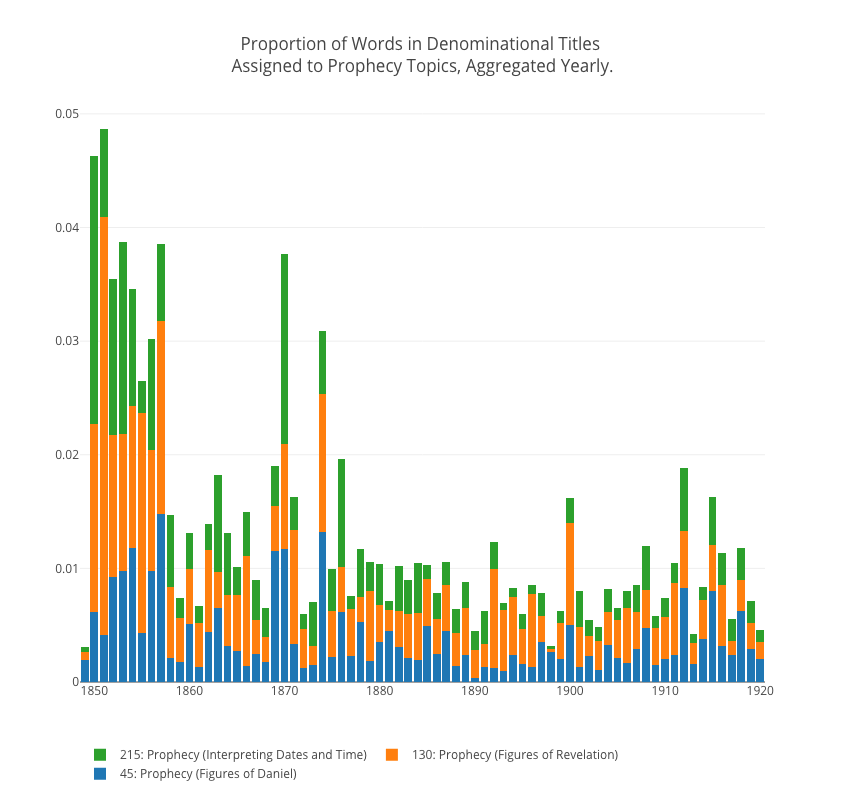

In [13]:
prophecy_denom = model.generate_graph_data(denom, ['prophecy'], labels)
model.generate_visualizations(prophecy_denom, 
                              'Denominational Titles', 'Prophecy',
                              output_dir
                             )

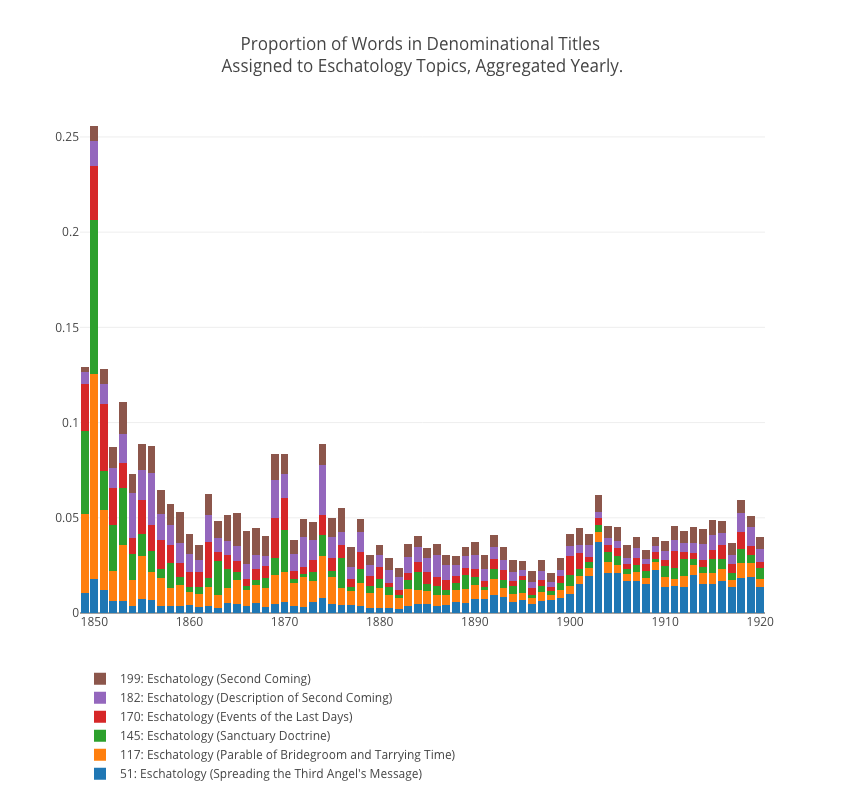

In [14]:
esch_denom = model.generate_graph_data(denom, ['eschatology'], labels)
model.generate_visualizations(esch_denom, 
                              'Denominational Titles', 'Eschatology', 
                              output_dir
                             )

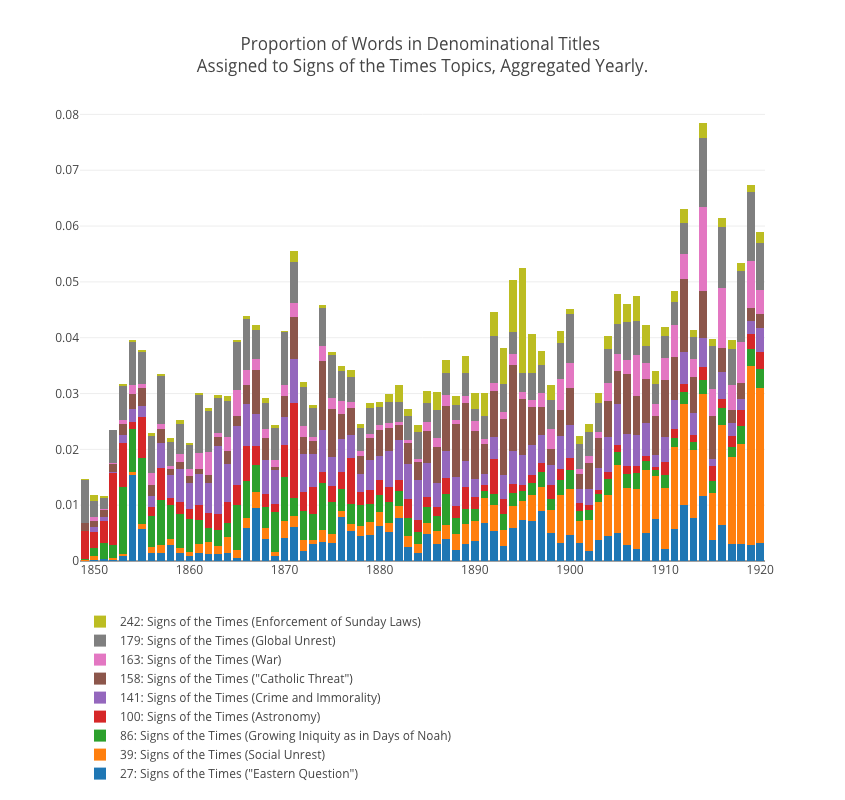

In [15]:
signs_denom = model.generate_graph_data(denom, ['signs_of_the_times'], labels)
model.generate_visualizations(signs_denom, 
                              'Denominational Titles', 'Signs of the Times', 
                              output_dir
                             )

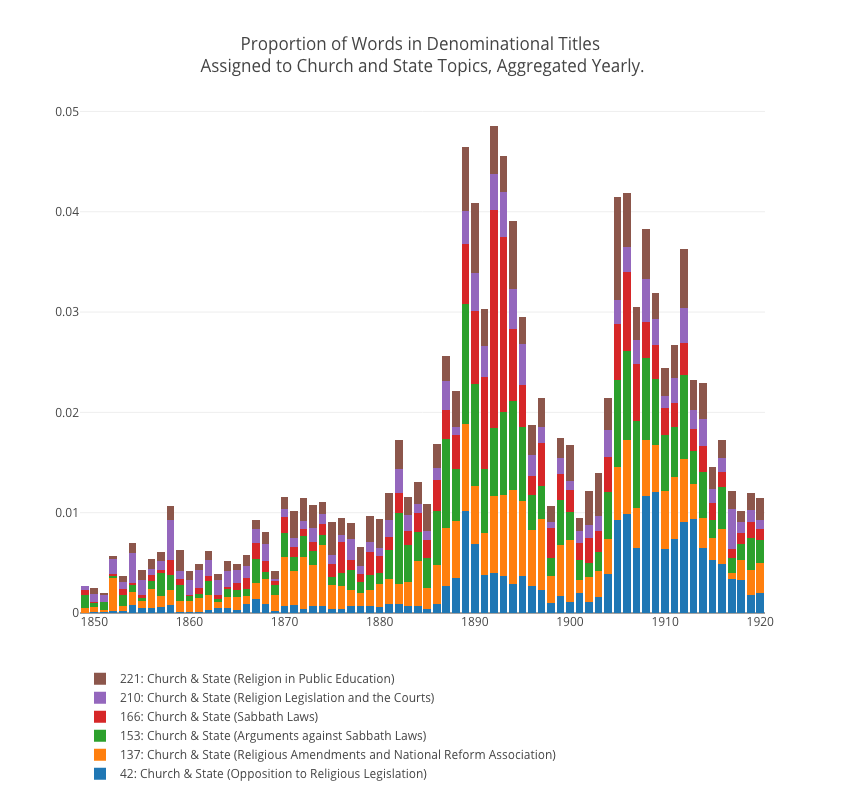

In [16]:
church_denom = model.generate_graph_data(denom, ['church_and_state'], labels)
model.generate_visualizations(church_denom, 
                              'Denominational Titles', 'Church and State', 
                              output_dir
                             )

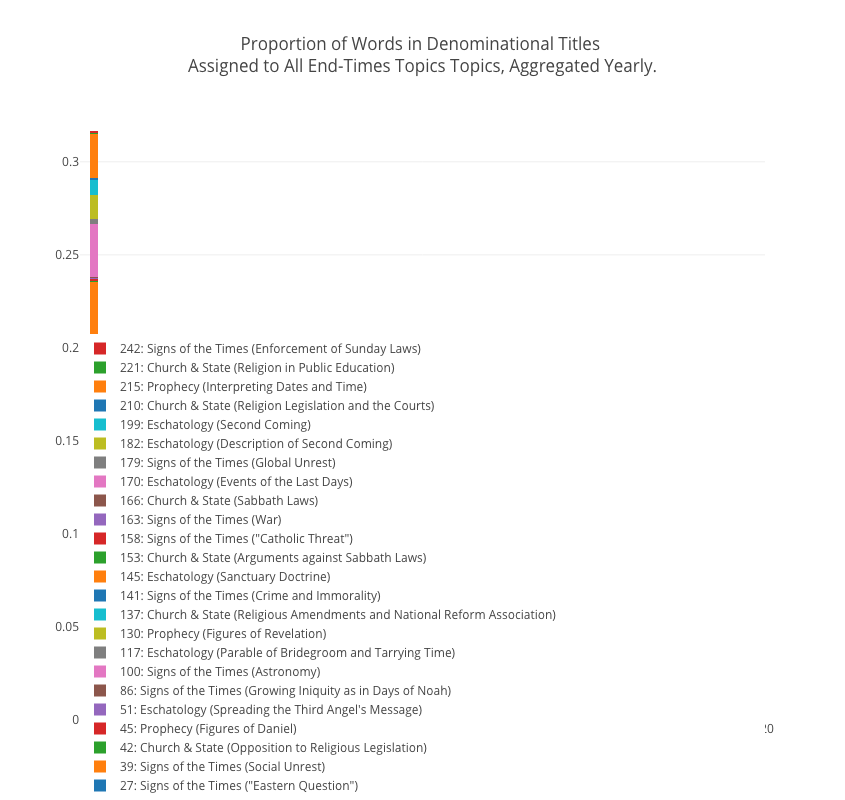

In [17]:
endTimes_denom = model.generate_graph_data(denom, 
                                           ['prophecy', 'eschatology', 'signs_of_the_times', 'church_and_state'], 
                                           labels)
model.generate_visualizations(endTimes_denom, 
                              'Denominational Titles', 'All End-Times Topics', 
                              output_dir
                             )

In [18]:
# Full Corpus excludes 'YI' because of the spotty coverage and distinctive vocabulary
titles = metadata['abrev'].unique().tolist()
titles.remove('YI')

full_corpus = model.subset_by_titles(doc_topic, metadata, titles, params[0])

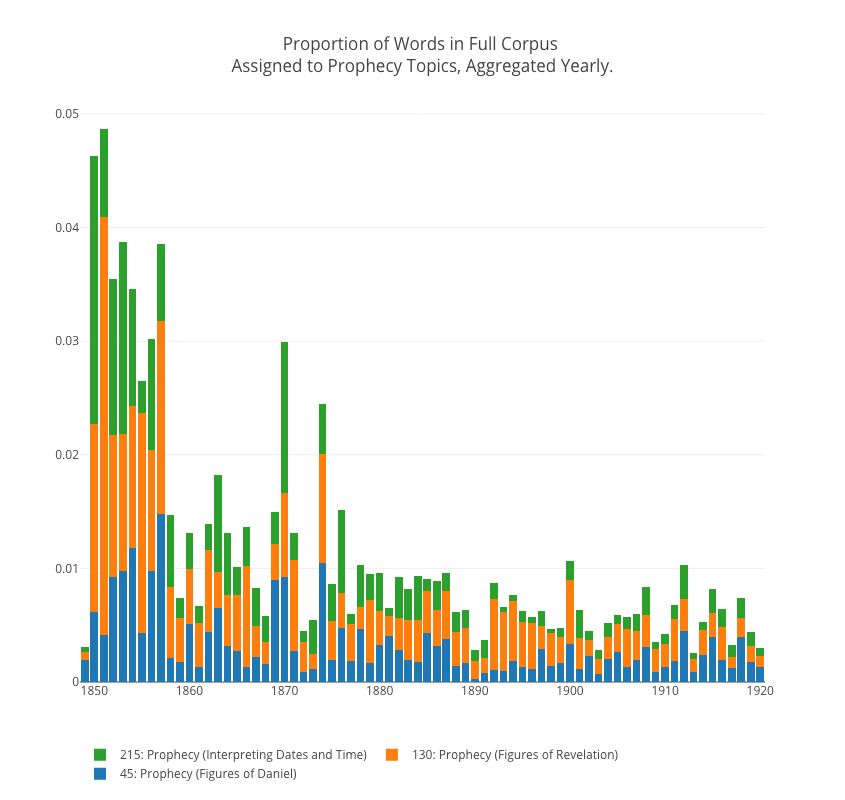

In [19]:
prophecy_full = model.generate_graph_data(full_corpus, ['prophecy'], labels)
model.generate_visualizations(prophecy_full, 
                              'Full Corpus', 'Prophecy',
                              output_dir
                             )

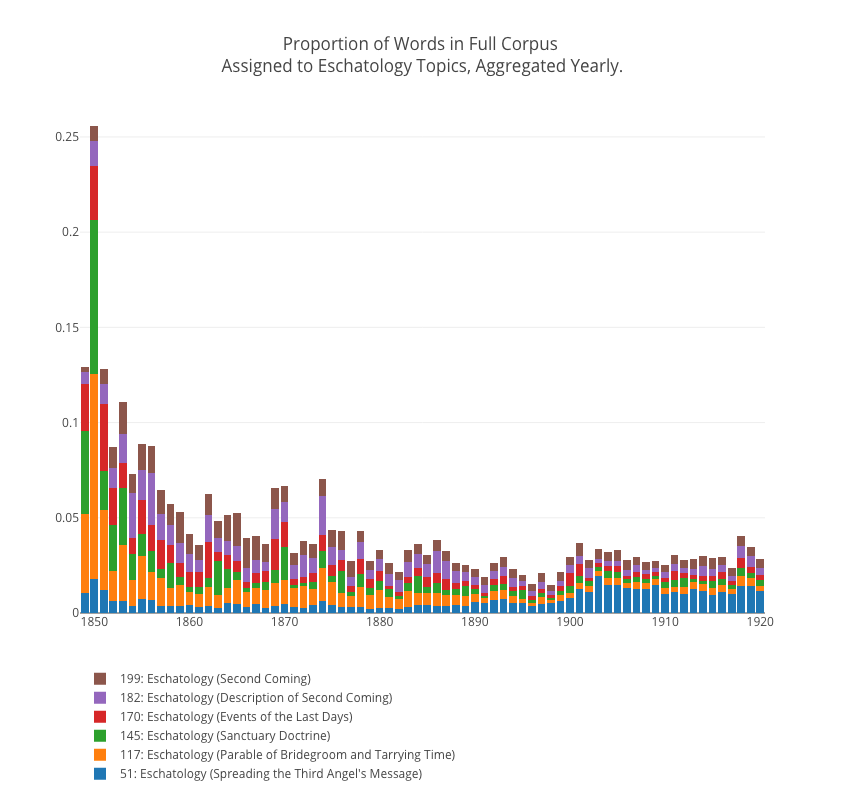

In [20]:
esch_full = model.generate_graph_data(full_corpus, ['eschatology'], labels)
model.generate_visualizations(esch_full, 
                              'Full Corpus', 'Eschatology',
                              output_dir
                             )

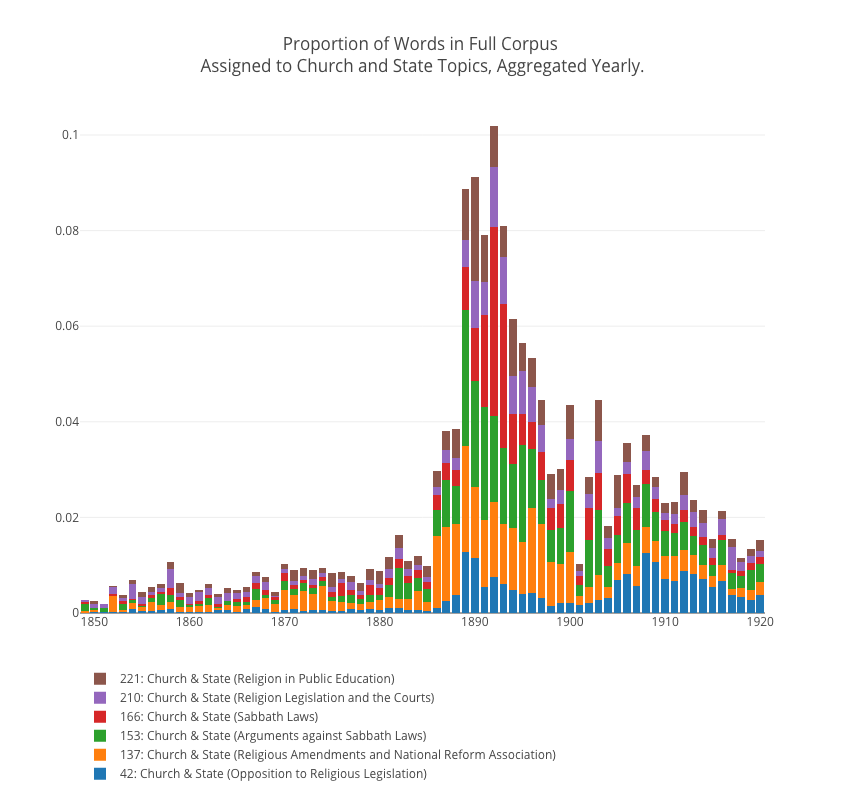

In [21]:
church_full = model.generate_graph_data(full_corpus, ['church_and_state'], labels)
model.generate_visualizations(church_full, 
                              'Full Corpus', 'Church and State',
                              output_dir
                             )

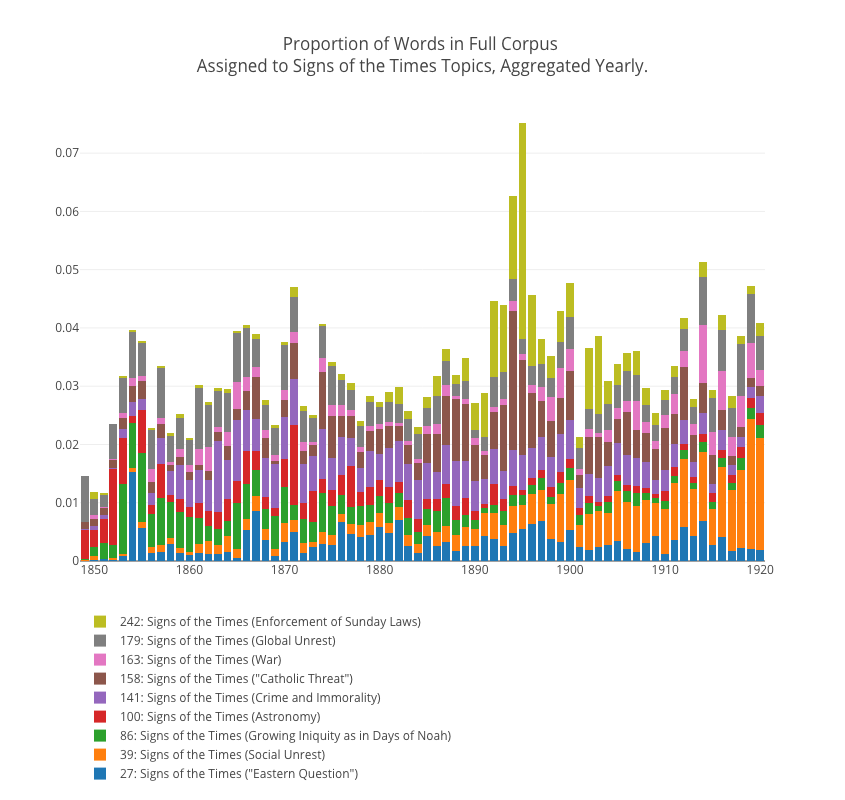

In [22]:
signs_full = model.generate_graph_data(full_corpus, ['signs_of_the_times'], labels)
model.generate_visualizations(signs_full, 
                              'Full Corpus', 'Signs of the Times',
                              output_dir
                             )

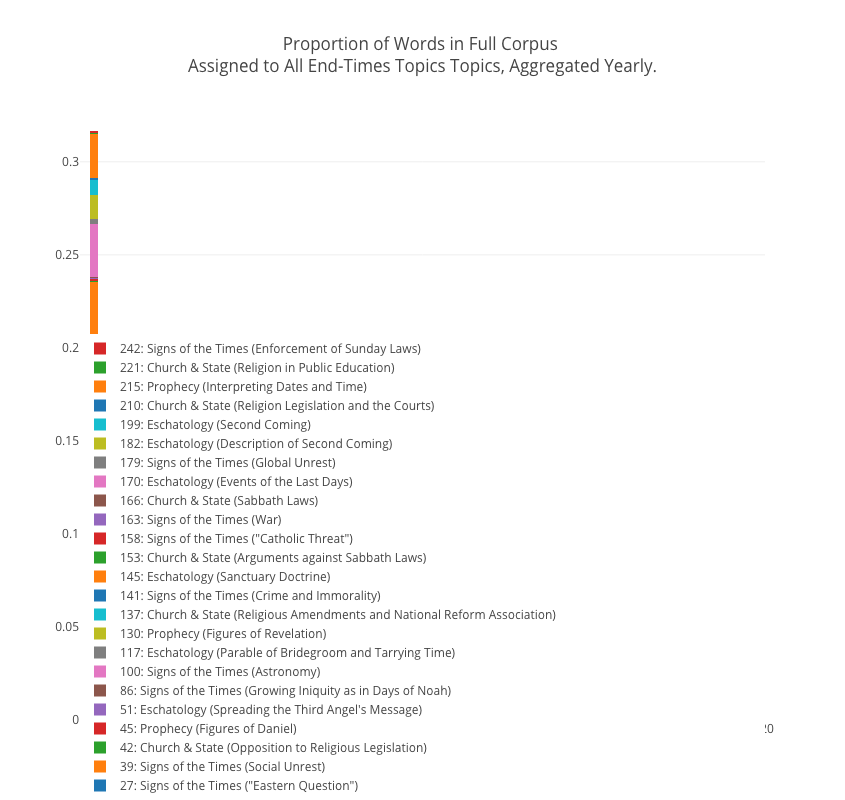

In [23]:
endTimes_full = model.generate_graph_data(full_corpus, 
                                           ['prophecy', 'eschatology', 'signs_of_the_times', 'church_and_state'], 
                                           labels)
model.generate_visualizations(endTimes_full, 
                              'Full Corpus', 'All End-Times Topics', 
                              output_dir
                             )